Dataset: https://drive.google.com/file/d/1MsuY-TTw2duDt8ZirMfDdhHgDslSjxVS/view?usp=share_link

### 1,2. Loading and down-sampling of images

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

file_path = '/content/drive/My Drive/Colab Notebooks/Galaxy10_DECals_downsampled.h5'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import h5py
import numpy as np

with h5py.File(file_path ,'r') as f:
  images = np.array(f['images'])
   # downsample from 64x64 to 32x32
  imgs = (images[:,::2,::2,:] + images[:,1::2,::2,:]
  + images[:,::2,1::2,:] + images[:,1::2,1::2,:])/4.
  labels = np.array(f['ans']) # read labels


### 3. Plotting some of the galaxy images
- Instead of handling the cahnnels manually(by taking mean or plotting each channel separately) we let the matplolib to handle the channels.

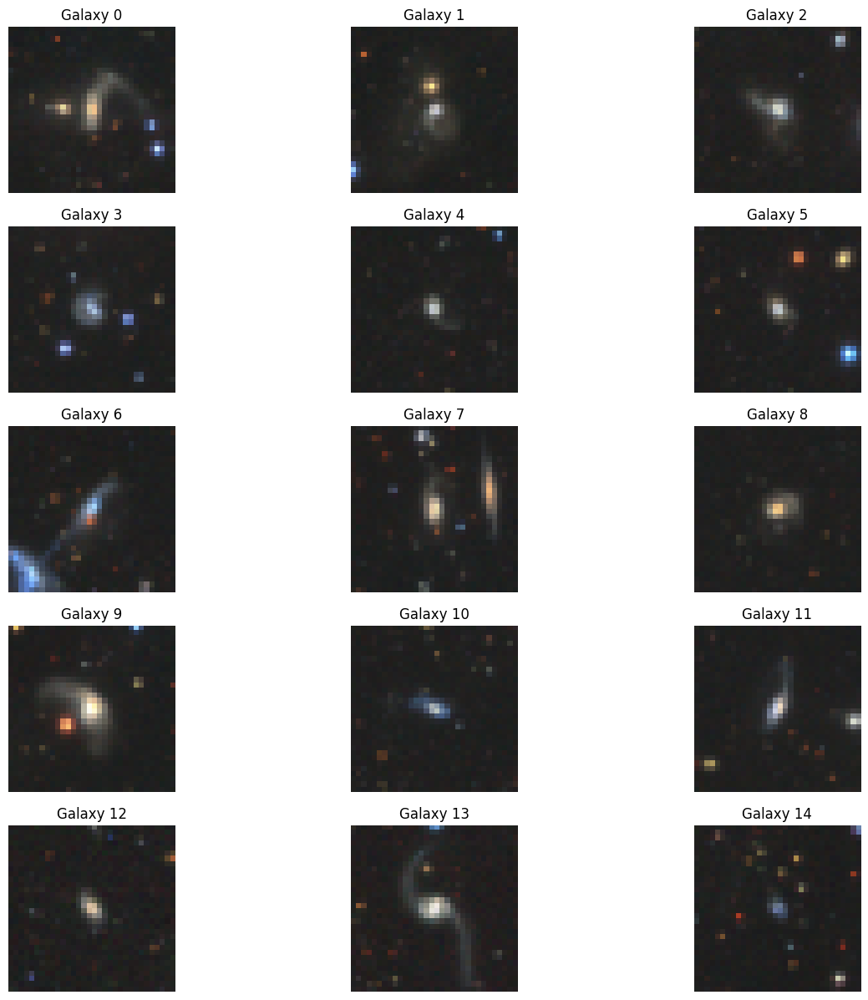

In [9]:
import matplotlib.pyplot as plt

# Plotting the normalized images
fig, axes = plt.subplots(5, 3, figsize=(15, 15))
axes = axes.flatten()  # Flatten the 5x3 array to a 1D array for easier iteration

for i, ax in enumerate(axes):
    img = imgs[i, ...]
    ax.imshow(img)
    ax.set_title(f"Galaxy {i}")
    ax.axis('off')  # Turn off the axes for each sub


### 4. Normalization


We normalize data using the MinMax library from scikit learn.

- The method is uisng the formula $X_{std} = \frac{x - x_{min}}{x_{max} - x_{min}}$, and $X_{scaled} = X_{std} \times (max - min) + min$


- Find the minimum and maximum pixels for each image

imgs_min = imgs.min(axis=(1, 2, 3), keepdims=True)
imgs_max = imgs.max(axis=(1, 2, 3), keepdims=True)

- Normalize to [0, 1]

imgs_normalized = (imgs - imgs_min) / (imgs_max - imgs_min)
- Scale to [-1, 1]

imgs_normalized = 2 * imgs_normalized - 1


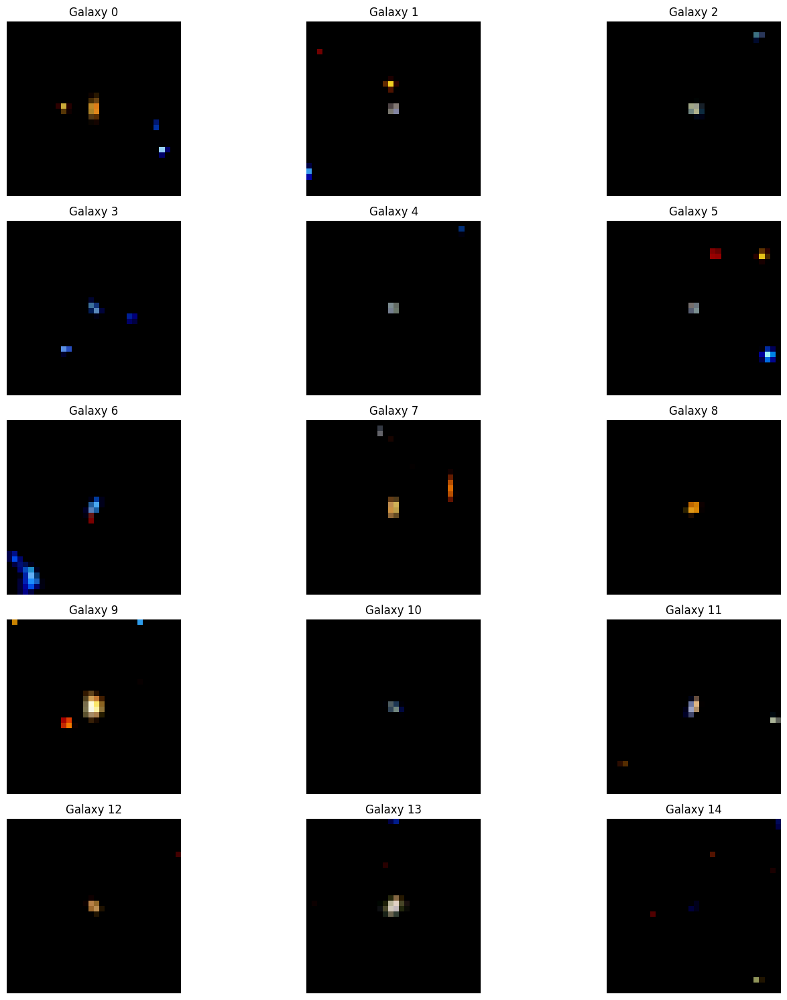

-0.8153105915736228
0.9454813359528489


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler


# Reshape the images into 2D arrays for MinMaxScaler
imgs_2d = imgs.reshape((-1, 3))  # Convert each image to a 2D array (height*width, channels)

# Use MinMaxScaler to scale pixel values to [-1, 1] for each channel independently
scaler = MinMaxScaler(feature_range=(-1, 1))
imgs_normalized_2d = scaler.fit_transform(imgs_2d)

# Reshape the normalized images back to 4D
imgs_normalized = imgs_normalized_2d.reshape(imgs.shape)

# Plotting the normalized images
fig, axes = plt.subplots(5, 3, figsize=(15, 15))
axes = axes.flatten()  # Flatten the 5x3 array to a 1D array for easier iteration

for i, ax in enumerate(axes):
    if i < len(imgs[:,...]):
        ax.imshow(imgs_normalized[i])
        ax.set_title(f"Galaxy {i}")
        ax.axis('off')

plt.tight_layout()
plt.show()

print(imgs_normalized[10000].min())
print(imgs_normalized[10000].max())


### 5. Building the generator for GAN model.

The generator function in GAN model is to generate the feature vector distribution and to provide facility to sample from it (in descriminative funciton).

- The generator learns the underlying data distribution in the given data set.
- They find the regions of higher probability for each class.

In [11]:
import tensorflow as tf
from tensorflow.keras import utils, layers
import glob
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import PIL
import time
from IPython import display
sns.set_style("ticks")
%matplotlib inline
def make_generator_model(N_noise=100, kernel_size=(5, 5), strides=(2, 2)):
    generator_input = layers.Input(shape=(N_noise,), name="generator_input")
    x = layers.Dense(4 * 4 * 256, use_bias=False, input_shape=(N_noise,))
    x = layers.BatchNormalization()(generator_input)
    x = layers.Dense(4 * 4 * 256, use_bias=False, input_shape=(N_noise,))(x)
    x = layers.LeakyReLU()(x)
    # starting from 4 x 4
    x = layers.Reshape((4, 4, 256))(x)

    # go to 8 x 8
    x = layers.Conv2DTranspose(128, kernel_size, strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # stay at 8 x 8
    x = layers.Conv2DTranspose(128, kernel_size, strides=(2, 2), padding='same', use_bias=False)(x)
    x = layers.BatchNormalization()(x)
    x = layers.LeakyReLU()(x)

    # go to 16 x 16
    generator_output = layers.Conv2DTranspose(3, kernel_size, strides=strides, padding='same', use_bias=False, activation='tanh')(x)

    return tf.keras.Model(generator_input, generator_output)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 generator_input (InputLaye  [(None, 100)]             0         
 r)                                                              
                                                                 
 batch_normalization (Batch  (None, 100)               400       
 Normalization)                                                  
                                                                 
 dense_2 (Dense)             (None, 4096)              409600    
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 128)         8192

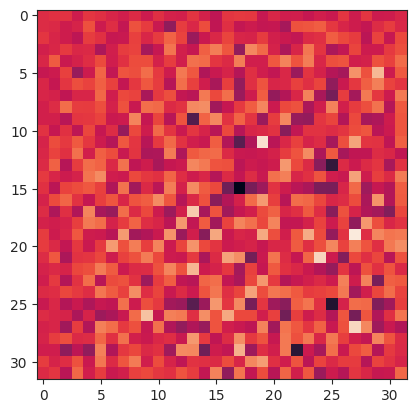

In [14]:
# Build the generator
N_noise = 100
generator = make_generator_model(N_noise=N_noise)
generator.summary()

# Plot an image generated by the untrained generator
noise = tf.random.normal([1, N_noise])  # note: prepend batch dimension!
generated_image = generator(noise, training=False)
generated_images_01 = (generated_image - generated_image.numpy().min()) / (generated_image.numpy().max() - generated_image.numpy().min())  # rescale to [0, 1] for plotting
plt.imshow(generated_images_01[0, :, :, 0])

### 6. Building the discriminator for GAN model

The discriminator in GAN model task is to identify classes or select from the distributions provided by generative function.

- Learns the dicision boundary that separates the different classes.
- The function estimates the probabilities and assign them to labels (y).

In [15]:
def make_discriminator_model(kernel_size=(3, 3), strides=(2, 2)):
    # model = tf.keras.Sequential()
    discriminator_input = layers.Input(shape=[32, 32, 3], name="discriminator_input")

    x = layers.Conv2D(64, kernel_size, strides=(1,1), padding='same')(discriminator_input)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # half the resolution -> 16 x 16
    x = layers.Conv2D(128, kernel_size, strides=strides, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # half the resolution -> 8 x 8
    x = layers.Conv2D(128, kernel_size, strides=strides, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # half the resolution -> 4 x 4
    x = layers.Conv2D(256, kernel_size, strides=strides, padding='same')(x)
    x = layers.LeakyReLU(alpha=0.2)(x)

    # Flatten and process to get predictions
    x = layers.Flatten()(x)
    x = layers.Dropout(0.4)(x)

    discriminator_output = layers.Dense(1)(x)

    return tf.keras.Model(discriminator_input, discriminator_output)

In [16]:
# Build the discriminator
discriminator = make_discriminator_model()
discriminator.summary()

# Try it out on the image generated by the generator
decision = tf.sigmoid(discriminator(generated_image, training=True))
print(decision)

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 discriminator_input (Input  [(None, 32, 32, 3)]       0         
 Layer)                                                          
                                                                 
 conv2d_4 (Conv2D)           (None, 32, 32, 64)        1792      
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 16, 16, 128)       73856     
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 8, 8, 128)         147584    
                                                           

### Preperations for training

In [17]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# Discriminator loss
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

# Generator loss
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

# Optimizers
generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5)

In [18]:
# Helper function to store checkpoints
checkpoint_dir = './training_checkpoints_mnist'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


In [19]:
N_epochs = 170
N_plot = 16
gif_noise = tf.random.normal([N_plot, N_noise])

In [20]:
# Helper function to generate images during the training
def generate_and_save_images(model, epoch, test_input):
    # Run in training = False mode
    predictions = model(test_input, training=False)

    fig = plt.figure(figsize=(8, 8))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow((predictions[i, ...] + 1.0) / 2.0)
        plt.axis('off')

    os.makedirs("./images_mnist", exist_ok=True)
    plt.savefig(os.path.join("./images_mnist", 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.show()

In [21]:
N_batch = 64
# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([N_batch, N_noise])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_output, fake_output

In [22]:
def train(dataset, epochs):
    all_gen_losses = []
    all_disc_losses = []

    for epoch in range(epochs):
        start = time.time()

        for image_batch in dataset:
            gen_loss, disc_loss, real_output, fake_output = train_step(image_batch)
            all_gen_losses.append(gen_loss)
            all_disc_losses.append(disc_loss)

        # Produce images for the GIF as you go
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, gif_noise)

        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))
        print(f'  Discriminator output on real data: {tf.sigmoid(real_output).numpy().mean()}')
        print(f'  Discriminator output on fake data: {tf.sigmoid(fake_output).numpy().mean()}')
        print(f'  Discriminator loss: {disc_loss.numpy().mean()}')
        print(f'  Generator loss: {gen_loss.numpy().mean()}')

        # Save the model every 10 epochs
        if (epoch + 1) % 10 == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

    # Generate after the final epoch
    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, gif_noise)
    return all_gen_losses, all_disc_losses

### 7. Training data

We train the images data on 170 epochs, and 64 batches.

- The training is done on RGB images: The generate image function we displayed the image with full (3 cahnnels).
**bold text**

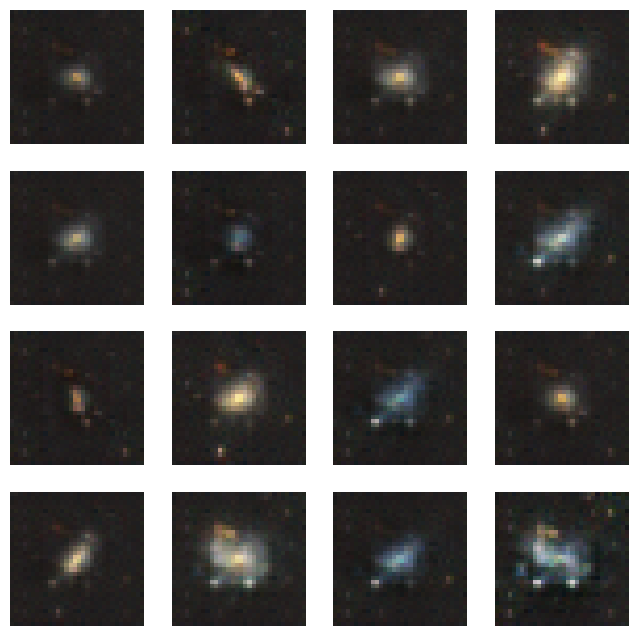

In [23]:
train_dataset = tf.data.Dataset.from_tensor_slices(imgs_normalized).batch(N_batch)
all_gen_losses, all_disc_losses = train(train_dataset, N_epochs)

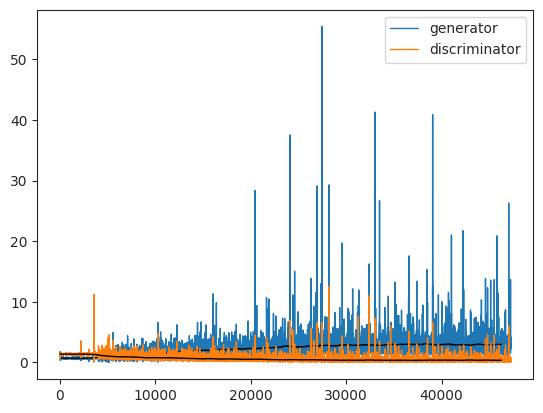

In [24]:
# plt.figure(figsize=(12, 12))
N = 1000

plt.plot(all_gen_losses, lw=1, label='generator')
plt.plot(np.convolve(all_gen_losses, np.ones(N)/N, mode='valid'), 'k-', lw=1)

plt.plot(all_disc_losses, lw=1, label='discriminator')
plt.plot(np.convolve(all_disc_losses, np.ones(N)/N, mode='valid'), 'k-', lw=1)

plt.legend()

In [25]:
# Restore the latest checkpoint
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [26]:
# Helper function to open PNGs
def display_imagea(epoch_no):
    return PIL.Image.open(os.path.join("./images_mnist", 'image_at_epoch_{:04d}.png'.format(epoch_no)))

In [27]:
def save_gif(filename="gan_mnist.gif", repeat_final_frame=50, folder="./images_mnist"):
    with imageio.get_writer(filename, mode='I') as writer:
        filenames = glob.glob(os.path.join(folder, 'image*.png'))
        filenames = sorted(filenames)
        for filename in filenames:
            image = imageio.imread(filename)
            writer.append_data(image)
        for i in range(repeat_final_frame):
            image = imageio.imread(filename)
            writer.append_data(image)

gif_file = "gan_mnist.gif"
save_gif(gif_file)

<ipython-input-27-2e62ff9d5474>:6: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)
<ipython-input-27-2e62ff9d5474>:9: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


### 7. Training images porcess:

As the training progress the quality of galaxy images improved, since the training process is:

- initially the generator generates data from random noise, as the first epochs have less similarity with actual images.
- Then the images became blury resembling some of features of galaxies.
- In following epochs the discriminator learns to distinguish between fake and real images as capturing more features of the data.
- However in final epochs of multiple program runs, we witnessed a mode collapse of the moel, where the generator only produced some of the simples not a diverse simple. But fortunately the mode colapse was less in last run .

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 182.5/182.5 kB 1.7 MB/s eta 0:00:00



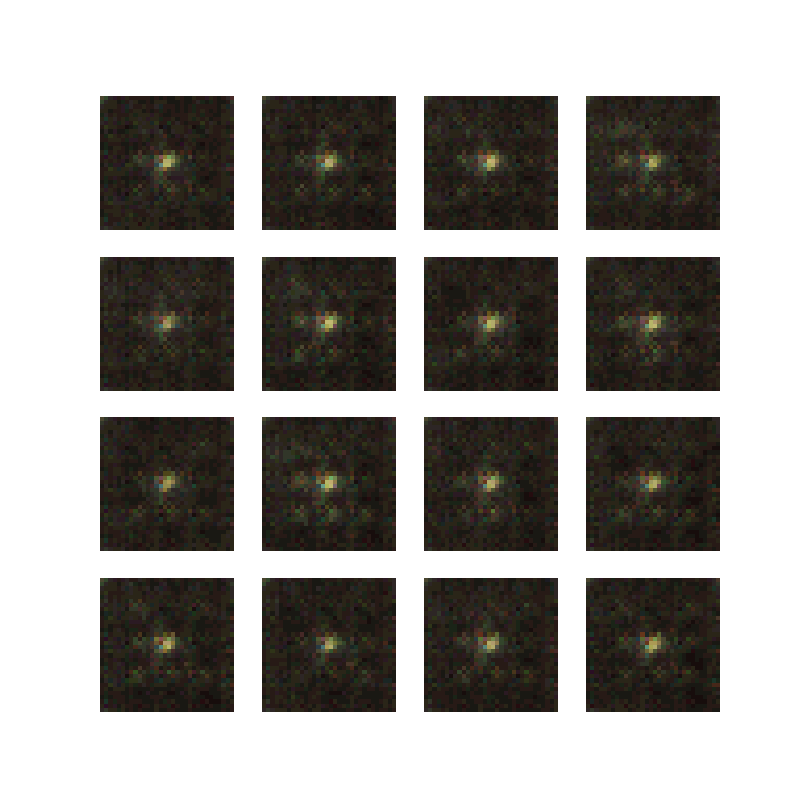

In [28]:
!pip install tensorflow_docs
import tensorflow_docs.vis.embed as embed
embed.embed_file(gif_file)

### 8. Fake galaxy images

- The generator genrated diverse set of fake galaxy images showing the model captures complexity of the data.

- The quality of the images require improvement. Although it captured the main shape of real galaxies, the quality still needs to be improved.

1/1 [==============================] - 0s 458ms/step


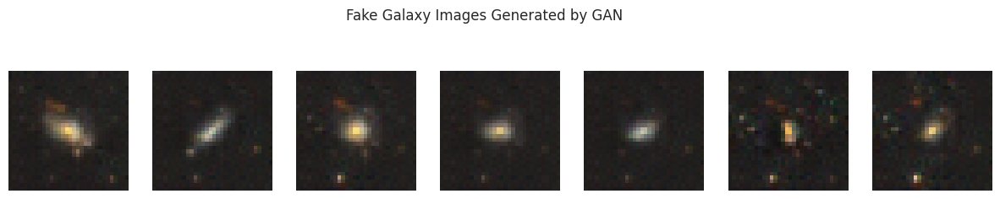

In [29]:
def generate_fake_images(generator, num_images=7):
    latent_vectors = np.random.normal(0, 1, size=(num_images, 100))  # latent space size is 100
    fake_images = generator.predict(latent_vectors)
    return fake_images

fake_images = generate_fake_images(generator, num_images=7)  # generator: Your trained GAN generator model
plt.figure(figsize=(15, 3))
for i in range(7):
    plt.subplot(1, 7, i+1)
    plt.imshow((fake_images[i]+1)/2) #unscaling back to original image pixels since we scaled them to [-1,1] initially
    plt.axis('off')
plt.suptitle('Fake Galaxy Images Generated by GAN')
plt.show()

### 9. Latent space interpolation


In [32]:
def interpolate_images(generator, z1, z2, num_steps):
    lambda_range = np.linspace(0, 1, num_steps)
    interpolated_z = [z1 + lambda_val * (z2 - z1) for lambda_val in lambda_range]
    interpolated_images = []
    for z in interpolated_z:
        fake_image = generator.predict(z)
        interpolated_images.append(fake_image)
    return interpolated_images

1/1 [==============================] - 0s 30ms/step


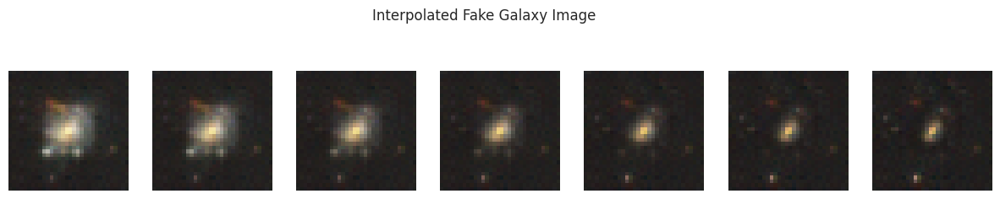

In [37]:
# Task 9: Interpolate latent vectors and plot interpolated images
z1 = np.random.normal(0, 1, size=(1, 100))
z2 = np.random.normal(0, 1, size=(1, 100))
num_steps=7
interpolated_images = interpolate_images(generator, z1, z2, num_steps)
plt.figure(figsize=(15, 3))
for i in range(num_steps):
    plt.subplot(1, num_steps, i+1)
    plt.imshow((interpolated_images[i][0]+1)/2)
    plt.axis('off')
plt.suptitle('Interpolated Fake Galaxy Image')
plt.show()

Or we can use following for interpolating

In [38]:
z_start = tf.random.normal((1, N_noise))
z_end = tf.random.normal((1, N_noise))

N_interp = 5
dx_interp = 1 / (N_interp - 1)
z_interp = tf.concat([(z_end - z_start) * n * dx_interp + z_start * (1 - n * dx_interp) for n in range(N_interp)], axis=0)
print(z_interp.shape)
print([n * dx_interp for n in range(N_interp)])
print([(1 - n * dx_interp) for n in range(N_interp)])


(5, 100)
[0.0, 0.25, 0.5, 0.75, 1.0]
[1.0, 0.75, 0.5, 0.25, 0.0]


In [39]:
predictions_interp = generator.predict(z_interp)


1/1 [==============================] - 0s 210ms/step


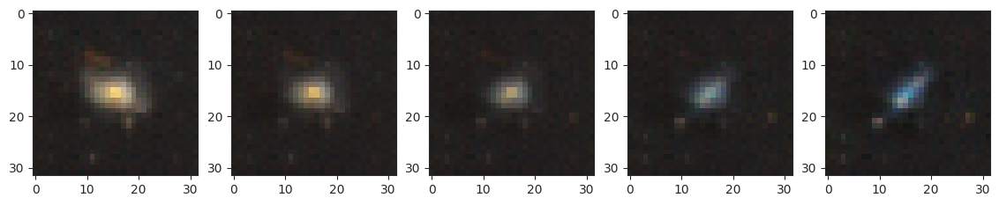

In [40]:
fig, axs = plt.subplots(1, N_interp, figsize=(14, 14))
for i in range(N_interp):
    axs[i].imshow((predictions_interp[i, :, :, :] + 1) / 2.0)